Assignment Problem-1: Wine Quality Classification

In [ ]:
# Core libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Machine Learning libraries
from sklearn.datasets import load_wine
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# LIME for explainability
import lime
import lime.lime_tabular

# Set plotting style
plt.style.use('default')
sns.set_palette("husl")

In [ ]:
# Load the wine dataset
wine_data = load_wine()
X = wine_data.data
y = wine_data.target
feature_names = wine_data.feature_names
target_names = wine_data.target_names

# Create a DataFrame for easier manipulation
df = pd.DataFrame(X, columns=feature_names)
df['wine_class'] = y
df['wine_class_name'] = [target_names[i] for i in y]

print(f"Dataset shape: {df.shape}")
print(f"Features: {len(feature_names)}")
print(f"Classes: {target_names}")
df.head()

Dataset shape: (178, 15)
Features: 13
Classes: ['class_0' 'class_1' 'class_2']


,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,wine_class,wine_class_name
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0,class_0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0,class_0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0,class_0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0,class_0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0,class_0


In [ ]:
print("Dataset Statistics:")
print(f"Total samples: {len(df)}")
print(f"Features: {len(feature_names)}")
print("\nClass distribution:")
print(df['wine_class_name'].value_counts())

Dataset Statistics:
Total samples: 178
Features: 13

Class distribution:
wine_class_name
class_1    71
class_0    59
class_2    48
Name: count, dtype: int64


In [ ]:
df.describe()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,wine_class
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258,0.938202
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474,0.775035
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000,0.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000,0.000000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000,1.000000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000,2.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000,2.000000


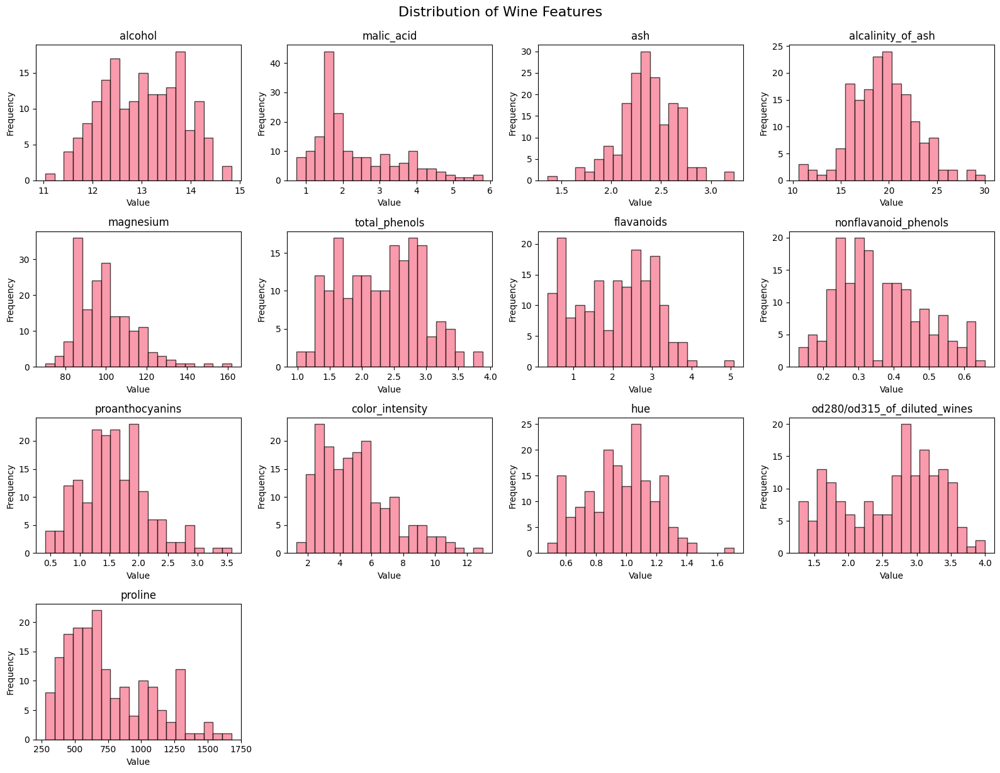

In [ ]:
# Visualize feature distributions
fig, axes = plt.subplots(4, 4, figsize=(16, 12))
axes = axes.ravel()

for i, feature in enumerate(feature_names[:13]):
    axes[i].hist(df[feature], bins=20, alpha=0.7, edgecolor='black')
    axes[i].set_title(f'{feature}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Frequency')

# Remove the last empty subplot
for i in range(13, 16):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.suptitle('Distribution of Wine Features', y=1.02, fontsize=16)
plt.show()

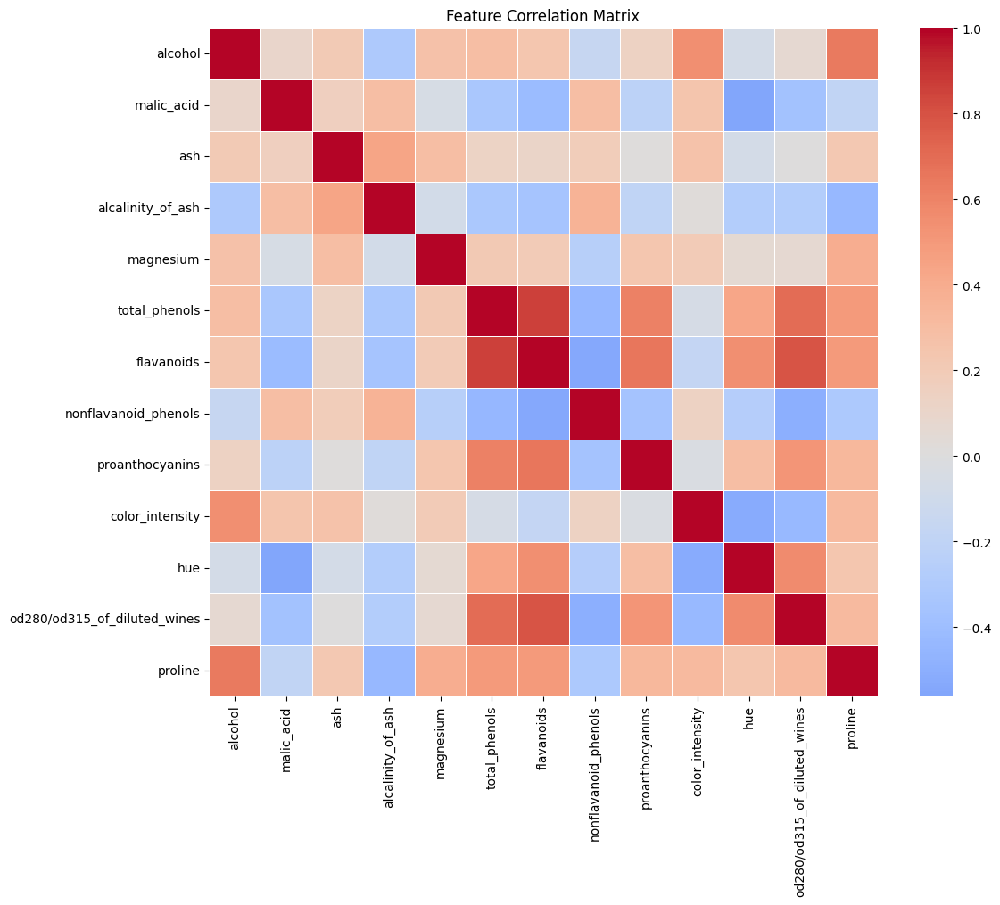


Highly correlated feature pairs (|correlation| > 0.8):
total_phenols - flavanoids: 0.865


In [ ]:
# Correlation matrix
plt.figure(figsize=(12, 10))
correlation_matrix = df[feature_names].corr()
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', center=0,
            square=True, linewidths=0.5)
plt.title('Feature Correlation Matrix')
plt.tight_layout()
plt.show()

# Find highly correlated features
high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            high_corr_pairs.append((correlation_matrix.columns[i],
                                  correlation_matrix.columns[j],
                                  correlation_matrix.iloc[i, j]))

print("\nHighly correlated feature pairs (|correlation| > 0.8):")
for feat1, feat2, corr in high_corr_pairs:
    print(f"{feat1} - {feat2}: {corr:.3f}")

In [ ]:
# Prepare features and target
X = df[feature_names].values
y = df['wine_class'].values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

print(f"Training set shape: {X_train.shape}")
print(f"Test set shape: {X_test.shape}")
print(f"\nClass distribution in training set:")
unique, counts = np.unique(y_train, return_counts=True)
for class_idx, count in zip(unique, counts):
    print(f"Class {class_idx} ({target_names[class_idx]}): {count} samples")

Training set shape: (124, 13)
Test set shape: (54, 13)

Class distribution in training set:
Class 0 (class_0): 41 samples
Class 1 (class_1): 50 samples
Class 2 (class_2): 33 samples


In [ ]:
# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Features scaled successfully!")
print(f"Original feature ranges (first 5 features):")
for i in range(5):
    print(f"{feature_names[i]}: [{X_train[:, i].min():.2f}, {X_train[:, i].max():.2f}]")

print(f"\nScaled feature ranges (first 5 features):")
for i in range(5):
    print(f"{feature_names[i]}: [{X_train_scaled[:, i].min():.2f}, {X_train_scaled[:, i].max():.2f}]")

Features scaled successfully!
Original feature ranges (first 5 features):
alcohol: [11.03, 14.83]
malic_acid: [0.74, 5.80]
ash: [1.36, 3.22]
alcalinity_of_ash: [10.60, 30.00]
magnesium: [70.00, 162.00]

Scaled feature ranges (first 5 features):
alcohol: [-2.38, 2.32]
malic_acid: [-1.47, 3.33]
ash: [-3.74, 3.20]
alcalinity_of_ash: [-2.69, 3.06]
magnesium: [-1.98, 4.08]


In [ ]:
# Train Logistic Regression model
lr_model = LogisticRegression(random_state=42, max_iter=1000)
lr_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_train = lr_model.predict(X_train_scaled)
y_pred_test = lr_model.predict(X_test_scaled)

# Calculate accuracy
train_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)

print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# Cross-validation
cv_scores = cross_val_score(lr_model, X_train_scaled, y_train, cv=5)
print(f"\nCross-validation scores: {cv_scores}")
print(f"Mean CV score: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

Training Accuracy: 1.0000
Test Accuracy: 0.9815

Cross-validation scores: [1.         0.96       1.         1.         0.95833333]
Mean CV score: 0.9837 (+/- 0.0400)


Classification Report (Test Set):
              precision    recall  f1-score   support

     class_0       0.95      1.00      0.97        18
     class_1       1.00      0.95      0.98        21
     class_2       1.00      1.00      1.00        15

    accuracy                           0.98        54
   macro avg       0.98      0.98      0.98        54
weighted avg       0.98      0.98      0.98        54



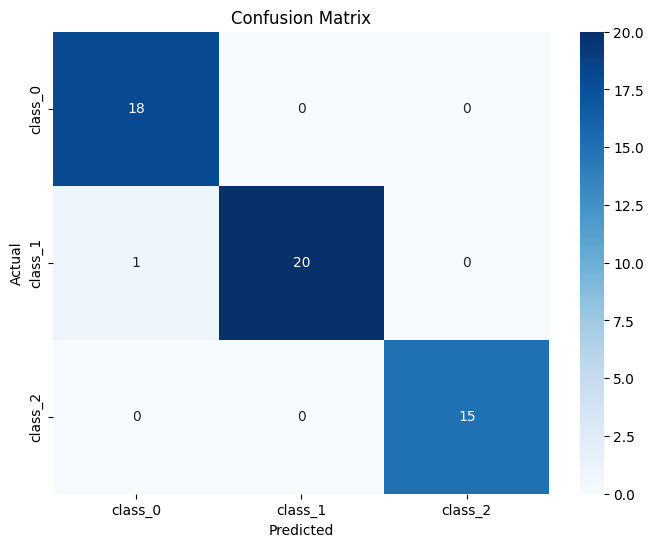

In [ ]:
# Detailed classification report
print("Classification Report (Test Set):")
print(classification_report(y_test, y_pred_test, target_names=target_names))

# Confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_test)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names, yticklabels=target_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
# Create LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_scaled,
    feature_names=feature_names,
    class_names=target_names,
    mode='classification',
    discretize_continuous=True
)

print("LIME explainer created successfully!")
print(f"Explainer training data shape: {X_train_scaled.shape}")
print(f"Feature names: {len(feature_names)}")
print(f"Class names: {target_names}")

LIME explainer created successfully!
Explainer training data shape: (124, 13)
Feature names: 13
Class names: ['class_0' 'class_1' 'class_2']


In [ ]:
# Select sample instances for explanation
sample_indices = [0, 10, 20]  # Different samples from test set

for idx in sample_indices:
    if idx < len(X_test_scaled):
        # Get prediction for this instance
        instance = X_test_scaled[idx]
        prediction = lr_model.predict([instance])[0]
        prediction_proba = lr_model.predict_proba([instance])[0]

        print(f"\n" + "="*60)
        print(f"Sample {idx + 1} - Actual: {target_names[y_test[idx]]}, Predicted: {target_names[prediction]}")
        print(f"Prediction probabilities: {dict(zip(target_names, prediction_proba))}")

        # Generate LIME explanation
        explanation = explainer.explain_instance(
            instance,
            lr_model.predict_proba,
            num_features=10
        )

        # Display explanation
        explanation.show_in_notebook(show_table=True)


Sample 1 - Actual: class_0, Predicted: class_0
Prediction probabilities: {np.str_('class_0'): np.float64(0.9907344141239348), np.str_('class_1'): np.float64(0.008831835886571283), np.str_('class_2'): np.float64(0.0004337499894938483)}



Sample 11 - Actual: class_1, Predicted: class_1
Prediction probabilities: {np.str_('class_0'): np.float64(0.021320685189525335), np.str_('class_1'): np.float64(0.7137359230420781), np.str_('class_2'): np.float64(0.26494339176839665)}



Sample 21 - Actual: class_1, Predicted: class_1
Prediction probabilities: {np.str_('class_0'): np.float64(0.04955705222418903), np.str_('class_1'): np.float64(0.9364598520478492), np.str_('class_2'): np.float64(0.013983095727961817)}


In [ ]:
# Aggregate LIME explanations across multiple samples
def get_lime_feature_importance(n_samples=50):
    """
    Calculate average feature importance across multiple LIME explanations
    """
    feature_importance = np.zeros(len(feature_names))

    # Select random samples for explanation
    sample_indices = np.random.choice(len(X_test_scaled),
                                    min(n_samples, len(X_test_scaled)),
                                    replace=False)

    for idx in sample_indices:
        instance = X_test_scaled[idx]
        explanation = explainer.explain_instance(
            instance,
            lr_model.predict_proba,
            num_features=len(feature_names)
        )

        # Extract feature importance
        for feature_idx, importance in explanation.as_list():
            # Find the feature index by name
            feature_name = feature_idx.split(' ')[0] if ' ' in feature_idx else feature_idx
            try:
                feat_idx = list(feature_names).index(feature_name)
                feature_importance[feat_idx] += abs(importance)
            except ValueError:
                # Handle cases where feature name doesn't match exactly
                for i, fname in enumerate(feature_names):
                    if fname in feature_idx or feature_idx in fname:
                        feature_importance[i] += abs(importance)
                        break

    return feature_importance / len(sample_indices)

# Calculate aggregated LIME feature importance
lime_importance = get_lime_feature_importance(30)

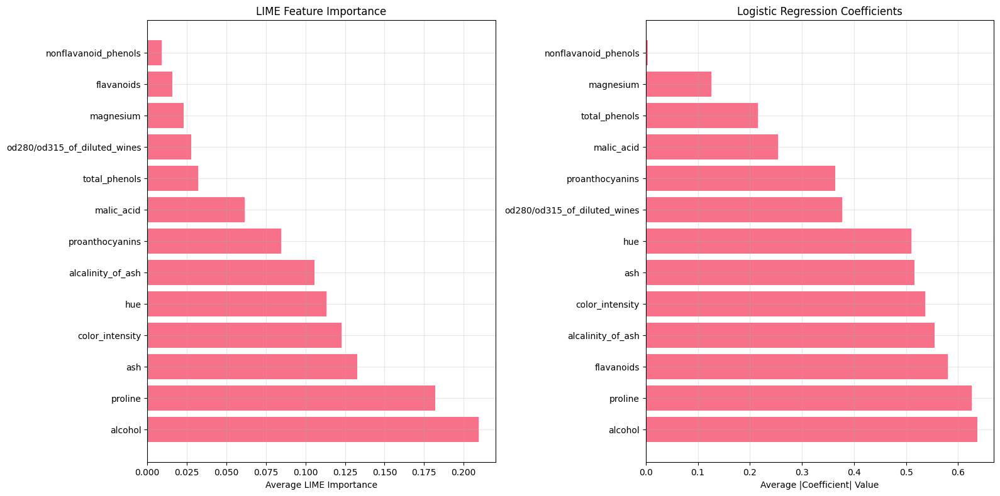

In [ ]:
# Compare LIME importance with model coefficients
# Get average absolute coefficients across all classes
model_importance = np.mean(np.abs(lr_model.coef_), axis=0)

# Create comparison plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# LIME importance
sorted_indices = np.argsort(lime_importance)[::-1]
ax1.barh(range(len(feature_names)), lime_importance[sorted_indices])
ax1.set_yticks(range(len(feature_names)))
ax1.set_yticklabels([feature_names[i] for i in sorted_indices])
ax1.set_xlabel('Average LIME Importance')
ax1.set_title('LIME Feature Importance')
ax1.grid(True, alpha=0.3)

# Model coefficients importance
sorted_indices_coef = np.argsort(model_importance)[::-1]
ax2.barh(range(len(feature_names)), model_importance[sorted_indices_coef])
ax2.set_yticks(range(len(feature_names)))
ax2.set_yticklabels([feature_names[i] for i in sorted_indices_coef])
ax2.set_xlabel('Average |Coefficient| Value')
ax2.set_title('Logistic Regression Coefficients')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# Top 10 most important features according to LIME
top_features_lime = np.argsort(lime_importance)[::-1][:10]
top_features_coef = np.argsort(model_importance)[::-1][:10]

print("Top 10 Features by LIME Importance:")
print("-" * 40)
for i, feat_idx in enumerate(top_features_lime):
    print(f"{i+1:2d}. {feature_names[feat_idx]:25s} {lime_importance[feat_idx]:.4f}")

print("\nTop 10 Features by Model Coefficients:")
print("-" * 40)
for i, feat_idx in enumerate(top_features_coef):
    print(f"{i+1:2d}. {feature_names[feat_idx]:25s} {model_importance[feat_idx]:.4f}")

Top 10 Features by LIME Importance:
----------------------------------------
 1. alcohol                   0.2095
 2. proline                   0.1822
 3. ash                       0.1326
 4. color_intensity           0.1229
 5. hue                       0.1133
 6. alcalinity_of_ash         0.1057
 7. proanthocyanins           0.0848
 8. malic_acid                0.0617
 9. total_phenols             0.0323
10. od280/od315_of_diluted_wines 0.0279

Top 10 Features by Model Coefficients:
----------------------------------------
 1. alcohol                   0.6365
 2. proline                   0.6262
 3. flavanoids                0.5800
 4. alcalinity_of_ash         0.5551
 5. color_intensity           0.5366
 6. ash                       0.5167
 7. hue                       0.5107
 8. od280/od315_of_diluted_wines 0.3776
 9. proanthocyanins           0.3634
10. malic_acid                0.2539


In [ ]:
# Analyze LIME explanations for each wine class
class_explanations = {class_name: [] for class_name in target_names}

# Get explanations for samples from each class
for class_idx, class_name in enumerate(target_names):
    # Find test samples belonging to this class
    class_samples = np.where(y_test == class_idx)[0]

    if len(class_samples) > 0:
        # Select up to 5 samples from this class
        selected_samples = np.random.choice(class_samples,
                                          min(5, len(class_samples)),
                                          replace=False)

        print(f"\n{class_name.upper()} WINE CLASS ANALYSIS")
        print("=" * 50)

        for sample_idx in selected_samples:
            instance = X_test_scaled[sample_idx]
            prediction = lr_model.predict([instance])[0]
            prediction_proba = lr_model.predict_proba([instance])[0]

            explanation = explainer.explain_instance(
                instance,
                lr_model.predict_proba,
                num_features=5
            )

            print(f"\nSample {sample_idx}: Predicted as {target_names[prediction]}")
            print(f"Confidence: {prediction_proba[prediction]:.3f}")
            print("Top 5 contributing features:")

            for feature, importance in explanation.as_list()[:5]:
                direction = "increases" if importance > 0 else "decreases"
                print(f"  • {feature}: {importance:+.3f} ({direction} prediction)")

            class_explanations[class_name].append(explanation.as_list())


CLASS_0 WINE CLASS ANALYSIS

Sample 44: Predicted as class_0
Confidence: 0.999
Top 5 contributing features:
  • proline > 0.78: -0.313 (decreases prediction)
  • alcohol > 0.75: -0.278 (decreases prediction)
  • hue > 0.66: +0.159 (increases prediction)
  • proanthocyanins > 0.60: +0.156 (increases prediction)
  • total_phenols > 0.81: -0.046 (decreases prediction)

Sample 28: Predicted as class_0
Confidence: 1.000
Top 5 contributing features:
  • proline > 0.78: -0.331 (decreases prediction)
  • alcohol > 0.75: -0.296 (decreases prediction)
  • color_intensity > 0.51: -0.237 (decreases prediction)
  • alcalinity_of_ash <= -0.73: -0.209 (decreases prediction)
  • hue > 0.66: +0.164 (increases prediction)

Sample 4: Predicted as class_0
Confidence: 0.755
Top 5 contributing features:
  • proline > 0.78: -0.330 (decreases prediction)
  • ash <= -0.61: +0.227 (increases prediction)
  • alcalinity_of_ash <= -0.73: -0.216 (decreases prediction)
  • hue > 0.66: +0.170 (increases prediction)


In [ ]:
# Create a comprehensive analysis report
print("🍷 WINE QUALITY CLASSIFICATION - INTERPRETABILITY ANALYSIS")
print("=" * 80)

print("\n📊 MODEL PERFORMANCE SUMMARY:")
print(f"• Test Accuracy: {test_accuracy:.1%}")
print(f"• Cross-validation Score: {cv_scores.mean():.1%} (±{cv_scores.std():.1%})")
print(f"• Model Type: Logistic Regression (Inherently Interpretable)")

print("\n🔍 KEY FINDINGS FROM LIME ANALYSIS:")

# Identify most important features across all explanations
top_5_features = np.argsort(lime_importance)[::-1][:5]
print("\nMost Influential Chemical Properties:")
for i, feat_idx in enumerate(top_5_features):
    print(f"{i+1}. {feature_names[feat_idx]} (LIME importance: {lime_importance[feat_idx]:.3f})")

print("\n🧪 CHEMICAL INTERPRETATION:")
chemical_interpretations = {
    'alcohol': 'Higher alcohol content often indicates better wine quality and class distinction',
    'flavanoids': 'Important phenolic compounds affecting taste, color, and quality',
    'od280/od315_of_diluted_wines': 'Protein content indicator, crucial for wine classification',
    'proline': 'Amino acid content that varies significantly between wine types',
    'color_intensity': 'Visual characteristic that strongly correlates with wine variety',
    'total_phenols': 'Antioxidant compounds that affect wine quality and aging potential',
    'hue': 'Color property that helps distinguish between different wine types',
    'malic_acid': 'Acid content that affects taste profile and wine classification'
}

for feat_idx in top_5_features:
    feature_name = feature_names[feat_idx]
    for key, interpretation in chemical_interpretations.items():
        if key in feature_name.lower():
            print(f"• {feature_name}: {interpretation}")
            break
    else:
        print(f"• {feature_name}: Significant chemical property for wine classification")

print("\n⚖️ MODEL INTERPRETABILITY ADVANTAGES:")
print("• LIME provides local explanations for individual predictions")
print("• Feature importance varies by wine class, showing nuanced decision-making")
print("• Chemical properties align with domain knowledge about wine quality")
print("• Model decisions are traceable to specific chemical measurements")

print("\n🎯 PRACTICAL APPLICATIONS:")
print("• Wine producers can focus on key chemical properties for quality improvement")
print("• Quality control processes can prioritize most influential measurements")
print("• Consumer education about wine characteristics and quality indicators")
print("• Regulatory compliance and wine classification standards")

print("\n⚠️ LIMITATIONS AND CONSIDERATIONS:")
print("• LIME explanations are local and may vary between similar samples")
print("• Model performance depends on the quality and representativeness of training data")
print("• Chemical measurements require precise laboratory analysis")
print("• Interpretations should be validated by domain experts (sommeliers, winemakers)")

🍷 WINE QUALITY CLASSIFICATION - INTERPRETABILITY ANALYSIS

📊 MODEL PERFORMANCE SUMMARY:
• Test Accuracy: 98.1%
• Cross-validation Score: 98.4% (±2.0%)
• Model Type: Logistic Regression (Inherently Interpretable)

🔍 KEY FINDINGS FROM LIME ANALYSIS:

Most Influential Chemical Properties:
1. alcohol (LIME importance: 0.210)
2. proline (LIME importance: 0.182)
3. ash (LIME importance: 0.133)
4. color_intensity (LIME importance: 0.123)
5. hue (LIME importance: 0.113)

🧪 CHEMICAL INTERPRETATION:
• alcohol: Higher alcohol content often indicates better wine quality and class distinction
• proline: Amino acid content that varies significantly between wine types
• ash: Significant chemical property for wine classification
• color_intensity: Visual characteristic that strongly correlates with wine variety
• hue: Color property that helps distinguish between different wine types

⚖️ MODEL INTERPRETABILITY ADVANTAGES:
• LIME provides local explanations for individual predictions
• Feature importan

## 1. Import Required Libraries

In [ ]:
!pip install lime --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
# Core libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Machine Learning libraries
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, roc_curve

# LIME for explainability
import lime
import lime.lime_tabular

# Set plotting style
plt.style.use('default')
sns.set_palette("husl")

print("Libraries imported successfully!")
print("Ready for medical AI analysis with explainable predictions.")

Libraries imported successfully!
Ready for medical AI analysis with explainable predictions.


## 2. Load and Explore the Breast Cancer Dataset

In [ ]:
# Load the breast cancer dataset
cancer_data = load_breast_cancer()
X = cancer_data.data
y = cancer_data.target
feature_names = cancer_data.feature_names
target_names = cancer_data.target_names

# Create a DataFrame for easier manipulation
df = pd.DataFrame(X, columns=feature_names)
df['diagnosis'] = y
df['diagnosis_name'] = [target_names[i] for i in y]

print(f"Dataset shape: {df.shape}")
print(f"Features: {len(feature_names)}")
print(f"Classes: {target_names}")
print(f"\nFirst few rows:")
df.head()

Dataset shape: (569, 32)
Features: 30
Classes: ['malignant' 'benign']

First few rows:


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,diagnosis,diagnosis_name
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0,malignant
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0,malignant
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0,malignant
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0,malignant
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0,malignant


In [ ]:
# Dataset information
print("Dataset Description:")
print(cancer_data.DESCR[:1000] + "...")

print("\n" + "="*50)
print("Dataset Statistics:")
print("="*50)
print(f"Total samples: {len(df)}")
print(f"Features: {len(feature_names)}")
print("\nClass distribution:")
print(df['diagnosis_name'].value_counts())
print("\nClass distribution (proportions):")
print(df['diagnosis_name'].value_counts(normalize=True))

Dataset Description:
.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

:Number of Instances: 569

:Number of Attributes: 30 numeric, predictive attributes and the class

:Attribute Information:
    - radius (mean of distances from center to points on the perimeter)
    - texture (standard deviation of gray-scale values)
    - perimeter
    - area
    - smoothness (local variation in radius lengths)
    - compactness (perimeter^2 / area - 1.0)
    - concavity (severity of concave portions of the contour)
    - concave points (number of concave portions of the contour)
    - symmetry
    - fractal dimension ("coastline approximation" - 1)

    The mean, standard error, and "worst" or largest (mean of the three
    worst/largest values) of these features were computed for each image,
    resulting in 30 features.  For instance, field 0 is Mean Radius, field
    10 is Radius SE, field 20 is 

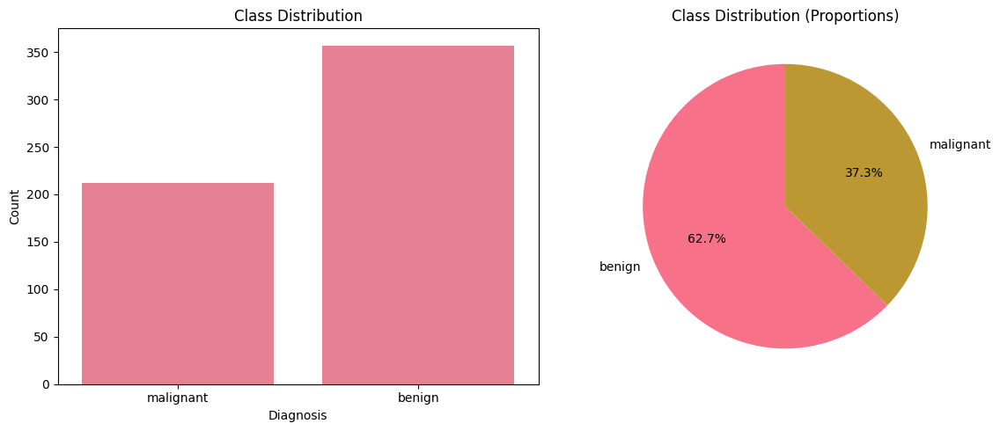


Dataset is imbalanced
Malignant cases: 212 (37.3%)
Benign cases: 357 (62.7%)


In [ ]:
# Visualize class distribution
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Count plot
sns.countplot(data=df, x='diagnosis_name', ax=ax1)
ax1.set_title('Class Distribution')
ax1.set_xlabel('Diagnosis')
ax1.set_ylabel('Count')

# Pie chart
diagnosis_counts = df['diagnosis_name'].value_counts()
ax2.pie(diagnosis_counts.values, labels=diagnosis_counts.index, autopct='%1.1f%%', startangle=90)
ax2.set_title('Class Distribution (Proportions)')

plt.tight_layout()
plt.show()

print(f"\nDataset is {'balanced' if abs(diagnosis_counts[0] - diagnosis_counts[1]) / len(df) < 0.1 else 'imbalanced'}")
print(f"Malignant cases: {diagnosis_counts['malignant']} ({diagnosis_counts['malignant']/len(df)*100:.1f}%)")
print(f"Benign cases: {diagnosis_counts['benign']} ({diagnosis_counts['benign']/len(df)*100:.1f}%)")

## 3. Data Preprocessing and Feature Analysis

In [ ]:
# Check for missing values and basic statistics
print("Missing values per feature:")
print(df.isnull().sum().sum())

print("\nData types:")
print(df.dtypes.value_counts())

print("\nBasic statistics:")
print(df.describe().round(2))

Missing values per feature:
0

Data types:
float64    30
int64       1
object      1
Name: count, dtype: int64

Basic statistics:
       mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
count       569.00        569.00          569.00     569.00           569.00   
mean         14.13         19.29           91.97     654.89             0.10   
std           3.52          4.30           24.30     351.91             0.01   
min           6.98          9.71           43.79     143.50             0.05   
25%          11.70         16.17           75.17     420.30             0.09   
50%          13.37         18.84           86.24     551.10             0.10   
75%          15.78         21.80          104.10     782.70             0.11   
max          28.11         39.28          188.50    2501.00             0.16   

       mean compactness  mean concavity  mean concave points  mean symmetry  \
count            569.00          569.00               569.00         5

Mean features (10): [np.str_('mean radius'), np.str_('mean texture'), np.str_('mean perimeter'), np.str_('mean area'), np.str_('mean smoothness')]...
SE features (0): []...
Worst features (10): [np.str_('worst radius'), np.str_('worst texture'), np.str_('worst perimeter'), np.str_('worst area'), np.str_('worst smoothness')]...


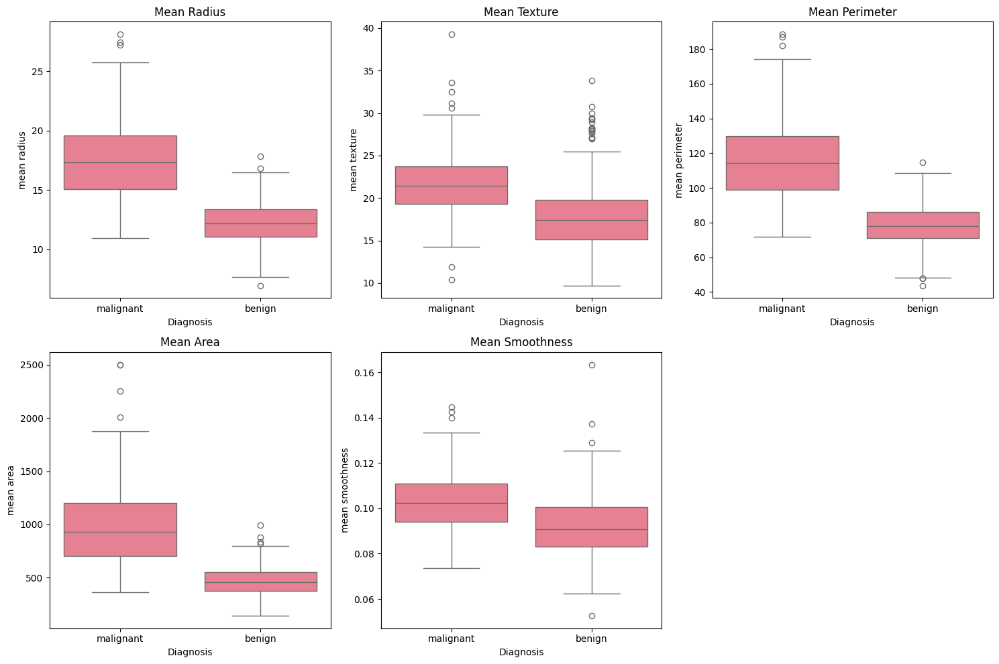

In [ ]:
# Feature categories analysis
# Group features by type (mean, se, worst)
mean_features = [col for col in feature_names if 'mean' in col or col in feature_names[:10]]
se_features = [col for col in feature_names if 'se' in col]
worst_features = [col for col in feature_names if 'worst' in col]

print(f"Mean features ({len(mean_features)}): {mean_features[:5]}...")
print(f"SE features ({len(se_features)}): {se_features[:5]}...")
print(f"Worst features ({len(worst_features)}): {worst_features[:5]}...")

# Visualize feature distributions for key measurements
key_features = ['mean radius', 'mean texture', 'mean perimeter', 'mean area', 'mean smoothness']

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for i, feature in enumerate(key_features):
    sns.boxplot(data=df, x='diagnosis_name', y=feature, ax=axes[i])
    axes[i].set_title(f'{feature.title()}')
    axes[i].set_xlabel('Diagnosis')

# Remove empty subplot
axes[5].remove()

plt.tight_layout()
plt.show()

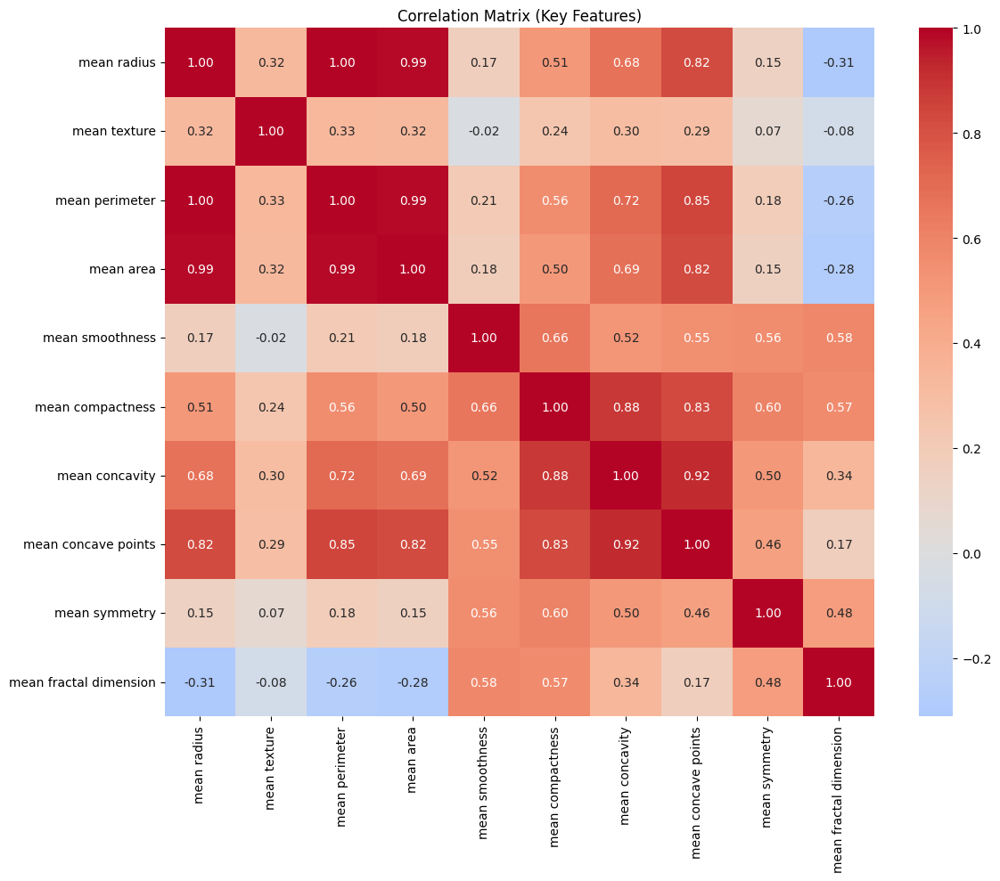


Highly correlated feature pairs (|r| > 0.8):
mean radius ↔ mean perimeter: 0.998
mean radius ↔ mean area: 0.987
mean radius ↔ mean concave points: 0.823
mean perimeter ↔ mean area: 0.987
mean perimeter ↔ mean concave points: 0.851
mean area ↔ mean concave points: 0.823
mean compactness ↔ mean concavity: 0.883
mean compactness ↔ mean concave points: 0.831
mean concavity ↔ mean concave points: 0.921


In [ ]:
# Correlation analysis
plt.figure(figsize=(12, 10))
correlation_matrix = df[feature_names[:10]].corr()  # Focus on first 10 features for readability
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.2f')
plt.title('Correlation Matrix (Key Features)')
plt.tight_layout()
plt.show()

# Find highly correlated features
high_corr = np.where(np.abs(correlation_matrix) > 0.8)
high_corr_pairs = [(correlation_matrix.index[x], correlation_matrix.columns[y], correlation_matrix.iloc[x, y])
                   for x, y in zip(*high_corr) if x != y and x < y]

print("\nHighly correlated feature pairs (|r| > 0.8):")
for feat1, feat2, corr in high_corr_pairs:
    print(f"{feat1} ↔ {feat2}: {corr:.3f}")

In [ ]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f"Training set: {X_train.shape[0]} samples")
print(f"Test set: {X_test.shape[0]} samples")

print(f"\nClass distribution in training set:")
unique, counts = np.unique(y_train, return_counts=True)
for class_idx, count in zip(unique, counts):
    print(f"Class {class_idx} ({target_names[class_idx]}): {count} samples")

print(f"\nClass distribution in test set:")
unique, counts = np.unique(y_test, return_counts=True)
for class_idx, count in zip(unique, counts):
    print(f"Class {class_idx} ({target_names[class_idx]}): {count} samples")

Training set: 455 samples
Test set: 114 samples

Class distribution in training set:
Class 0 (malignant): 170 samples
Class 1 (benign): 285 samples

Class distribution in test set:
Class 0 (malignant): 42 samples
Class 1 (benign): 72 samples


In [ ]:
# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print("Features scaled successfully!")
print(f"Original feature ranges (first 5 features):")
for i in range(5):
    print(f"{feature_names[i]}: [{X_train[:, i].min():.2f}, {X_train[:, i].max():.2f}]")

print(f"\nScaled feature ranges (first 5 features):")
for i in range(5):
    print(f"{feature_names[i]}: [{X_train_scaled[:, i].min():.2f}, {X_train_scaled[:, i].max():.2f}]")

Features scaled successfully!
Original feature ranges (first 5 features):
mean radius: [6.98, 28.11]
mean texture: [9.71, 39.28]
mean perimeter: [43.79, 188.50]
mean area: [143.50, 2499.00]
mean smoothness: [0.06, 0.14]

Scaled feature ranges (first 5 features):
mean radius: [-2.03, 4.02]
mean texture: [-2.17, 4.55]
mean perimeter: [-1.98, 4.02]
mean area: [-1.47, 5.37]
mean smoothness: [-2.50, 3.61]


## 4. Random Forest Model Training

In [ ]:
# Train Random Forest model
rf_model = RandomForestClassifier(
    n_estimators=100,
    random_state=42,
    max_depth=10,
    min_samples_split=5,
    min_samples_leaf=2
)

rf_model.fit(X_train_scaled, y_train)

print("Random Forest model trained successfully!")
print(f"Number of trees: {rf_model.n_estimators}")
print(f"Max depth: {rf_model.max_depth}")
print(f"Number of features: {rf_model.n_features_in_}")

Random Forest model trained successfully!
Number of trees: 100
Max depth: 10
Number of features: 30


In [ ]:
# Make predictions
y_pred_train = rf_model.predict(X_train_scaled)
y_pred_test = rf_model.predict(X_test_scaled)
y_pred_proba_test = rf_model.predict_proba(X_test_scaled)

# Calculate accuracies
train_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)
auc_score = roc_auc_score(y_test, y_pred_proba_test[:, 1])

print(f"Training Accuracy: {train_accuracy:.1%}")
print(f"Test Accuracy: {test_accuracy:.1%}")
print(f"AUC Score: {auc_score:.3f}")

# Cross-validation
cv_scores = cross_val_score(rf_model, X_train_scaled, y_train, cv=5, scoring='accuracy')
print(f"\nCross-validation scores: {cv_scores}")
print(f"CV Mean Accuracy: {cv_scores.mean():.1%} (±{cv_scores.std():.1%})")

Training Accuracy: 99.3%
Test Accuracy: 95.6%
AUC Score: 0.993

Cross-validation scores: [0.97802198 0.98901099 0.93406593 0.92307692 0.94505495]
CV Mean Accuracy: 95.4% (±2.5%)


## 5. Model Performance Evaluation

Classification Report (Test Set):
              precision    recall  f1-score   support

   malignant       0.95      0.93      0.94        42
      benign       0.96      0.97      0.97        72

    accuracy                           0.96       114
   macro avg       0.96      0.95      0.95       114
weighted avg       0.96      0.96      0.96       114



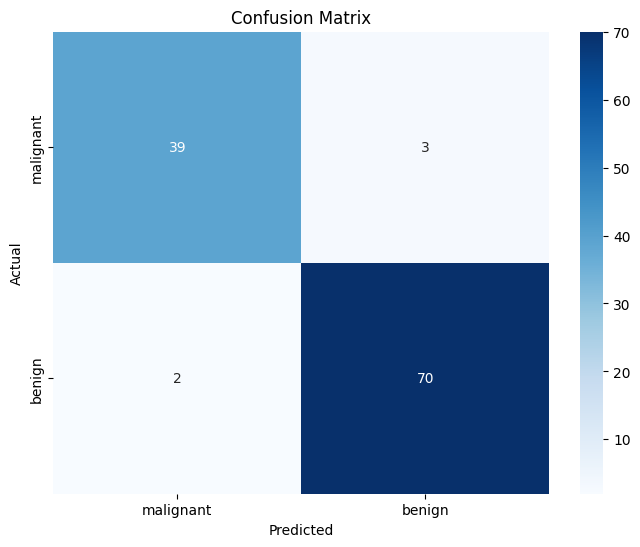


🏥 MEDICAL PERFORMANCE METRICS:
Sensitivity (Malignant Detection Rate): 97.2%
Specificity (Benign Detection Rate): 92.9%
Positive Predictive Value: 95.9%
Negative Predictive Value: 95.1%


In [ ]:
# Detailed classification report
print("Classification Report (Test Set):")
print(classification_report(y_test, y_pred_test, target_names=target_names))

# Confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_test)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names, yticklabels=target_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculate medical metrics
tn, fp, fn, tp = cm.ravel()
sensitivity = tp / (tp + fn)  # True Positive Rate (Recall for malignant)
specificity = tn / (tn + fp)  # True Negative Rate (Recall for benign)
ppv = tp / (tp + fp)  # Positive Predictive Value (Precision for malignant)
npv = tn / (tn + fn)  # Negative Predictive Value (Precision for benign)

print(f"\n🏥 MEDICAL PERFORMANCE METRICS:")
print(f"Sensitivity (Malignant Detection Rate): {sensitivity:.1%}")
print(f"Specificity (Benign Detection Rate): {specificity:.1%}")
print(f"Positive Predictive Value: {ppv:.1%}")
print(f"Negative Predictive Value: {npv:.1%}")

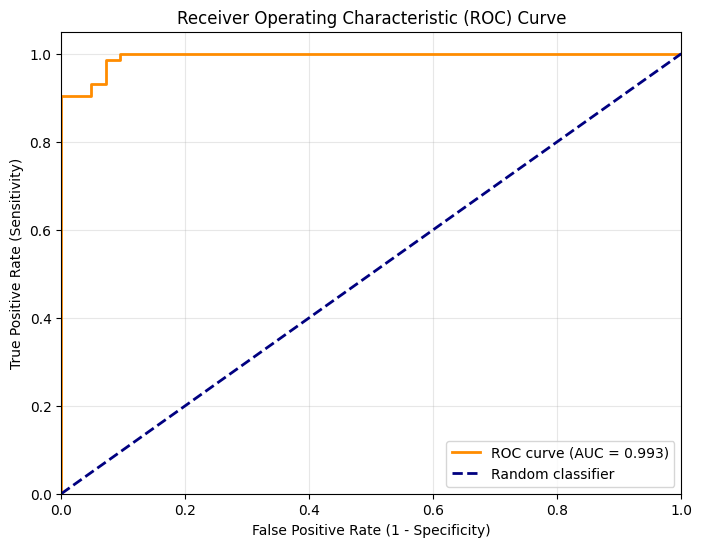


AUC Score: 0.993
Excellent model performance for medical diagnosis!


In [ ]:
# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba_test[:, 1])

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {auc_score:.3f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

print(f"\nAUC Score: {auc_score:.3f}")
if auc_score > 0.9:
    print("Excellent model performance for medical diagnosis!")
elif auc_score > 0.8:
    print("Good model performance for medical diagnosis.")
else:
    print("Model performance may need improvement for medical applications.")

## 6. LIME Implementation for Model Explanation

In [ ]:
# Create LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_scaled,
    feature_names=feature_names,
    class_names=target_names,
    mode='classification',
    discretize_continuous=True
)

print("LIME explainer created successfully!")
print(f"Explainer training data shape: {X_train_scaled.shape}")
print(f"Feature names: {len(feature_names)}")
print(f"Class names: {target_names}")

LIME explainer created successfully!
Explainer training data shape: (455, 30)
Feature names: 30
Class names: ['malignant' 'benign']


In [ ]:
# Select sample instances for explanation
# Choose examples from both classes
malignant_indices = np.where(y_test == 1)[0][:3]  # 3 malignant cases
benign_indices = np.where(y_test == 0)[0][:3]     # 3 benign cases
sample_indices = np.concatenate([malignant_indices, benign_indices])

print("Selected sample cases for LIME explanation:")
for i, idx in enumerate(sample_indices):
    actual_class = target_names[y_test[idx]]
    predicted_class = target_names[y_pred_test[idx]]
    confidence = np.max(y_pred_proba_test[idx])
    print(f"Sample {i+1}: Actual={actual_class}, Predicted={predicted_class}, Confidence={confidence:.1%}")

Selected sample cases for LIME explanation:
Sample 1: Actual=benign, Predicted=benign, Confidence=100.0%
Sample 2: Actual=benign, Predicted=malignant, Confidence=72.2%
Sample 3: Actual=benign, Predicted=benign, Confidence=99.7%
Sample 4: Actual=malignant, Predicted=malignant, Confidence=100.0%
Sample 5: Actual=malignant, Predicted=malignant, Confidence=86.0%
Sample 6: Actual=malignant, Predicted=malignant, Confidence=99.7%


In [ ]:
# Generate LIME explanations for selected samples
explanations = []
class_explanations = {'malignant': [], 'benign': []}

print("Generating LIME explanations...\n")

for i, idx in enumerate(sample_indices):
    instance = X_test_scaled[idx]
    actual_class = target_names[y_test[idx]]
    predicted_class = target_names[y_pred_test[idx]]

    print(f"\n{'='*60}")
    print(f"EXPLANATION {i+1}: {actual_class.upper()} CASE")
    print(f"{'='*60}")
    print(f"Actual: {actual_class} | Predicted: {predicted_class}")

    # Generate explanation
    explanation = explainer.explain_instance(
        instance,
        rf_model.predict_proba,
        num_features=10
    )

    explanations.append(explanation)
    class_explanations[actual_class].append(explanation.as_list())

    # Display explanation
    explanation.show_in_notebook(show_table=True)

Generating LIME explanations...


EXPLANATION 1: BENIGN CASE
Actual: benign | Predicted: benign



EXPLANATION 2: BENIGN CASE
Actual: benign | Predicted: malignant



EXPLANATION 3: BENIGN CASE
Actual: benign | Predicted: benign



EXPLANATION 4: MALIGNANT CASE
Actual: malignant | Predicted: malignant



EXPLANATION 5: MALIGNANT CASE
Actual: malignant | Predicted: malignant



EXPLANATION 6: MALIGNANT CASE
Actual: malignant | Predicted: malignant


## 7. Feature Importance Analysis

In [ ]:
# Random Forest feature importance
rf_importance = rf_model.feature_importances_

# Aggregate LIME explanations across multiple samples
def get_lime_feature_importance(n_samples=50):
    """
    Calculate average feature importance across multiple LIME explanations
    """
    feature_importance = np.zeros(len(feature_names))

    # Select random samples for explanation
    sample_indices = np.random.choice(len(X_test_scaled),
                                    min(n_samples, len(X_test_scaled)),
                                    replace=False)

    for idx in sample_indices:
        instance = X_test_scaled[idx]
        explanation = explainer.explain_instance(
            instance,
            rf_model.predict_proba,
            num_features=len(feature_names)
        )

        # Extract feature importance
        for feature_idx, importance in explanation.as_list():
            # Find the feature index by name
            feature_name = feature_idx.split(' ')[0] if ' ' in feature_idx else feature_idx
            try:
                feat_idx = list(feature_names).index(feature_name)
                feature_importance[feat_idx] += abs(importance)
            except ValueError:
                # Handle cases where feature name doesn't match exactly
                for i, fname in enumerate(feature_names):
                    if fname in feature_idx or feature_idx in fname:
                        feature_importance[i] += abs(importance)
                        break

    return feature_importance / len(sample_indices)

# Calculate aggregated LIME feature importance
lime_importance = get_lime_feature_importance(30)

print("LIME feature importance calculated!")

LIME feature importance calculated!


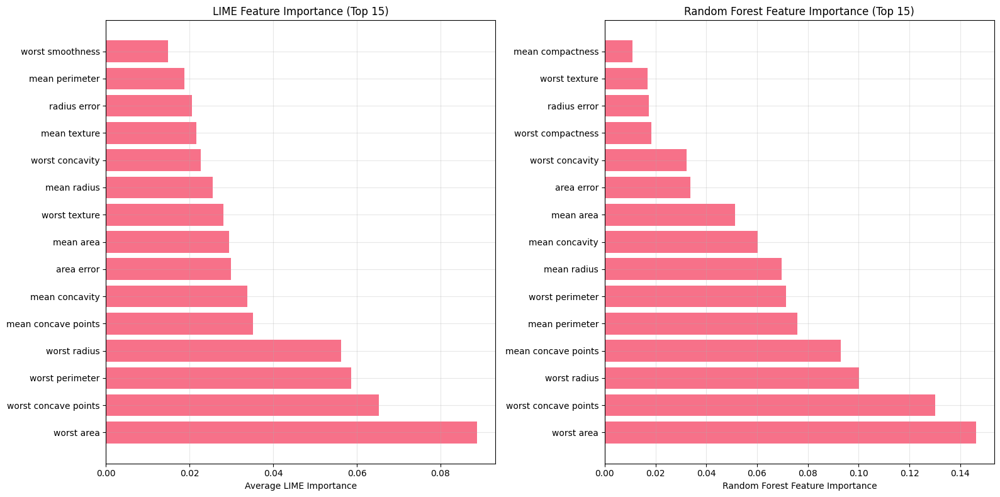

In [ ]:
# Compare LIME importance with Random Forest feature importance
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# LIME importance
sorted_indices_lime = np.argsort(lime_importance)[::-1][:15]  # Top 15 features
ax1.barh(range(len(sorted_indices_lime)), lime_importance[sorted_indices_lime])
ax1.set_yticks(range(len(sorted_indices_lime)))
ax1.set_yticklabels([feature_names[i] for i in sorted_indices_lime])
ax1.set_xlabel('Average LIME Importance')
ax1.set_title('LIME Feature Importance (Top 15)')
ax1.grid(True, alpha=0.3)

# Random Forest feature importance
sorted_indices_rf = np.argsort(rf_importance)[::-1][:15]  # Top 15 features
ax2.barh(range(len(sorted_indices_rf)), rf_importance[sorted_indices_rf])
ax2.set_yticks(range(len(sorted_indices_rf)))
ax2.set_yticklabels([feature_names[i] for i in sorted_indices_rf])
ax2.set_xlabel('Random Forest Feature Importance')
ax2.set_title('Random Forest Feature Importance (Top 15)')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# Top 10 most important features according to both methods
top_features_lime = np.argsort(lime_importance)[::-1][:10]
top_features_rf = np.argsort(rf_importance)[::-1][:10]

print("Top 10 Features by LIME Importance:")
print("-" * 40)
for i, feat_idx in enumerate(top_features_lime):
    print(f"{i+1:2d}. {feature_names[feat_idx]:25s} {lime_importance[feat_idx]:.4f}")

print("\nTop 10 Features by Random Forest Importance:")
print("-" * 45)
for i, feat_idx in enumerate(top_features_rf):
    print(f"{i+1:2d}. {feature_names[feat_idx]:25s} {rf_importance[feat_idx]:.4f}")

# Find common important features
common_features = set(top_features_lime) & set(top_features_rf)
print(f"\nCommon important features ({len(common_features)}/10):")
print("-" * 35)
for feat_idx in common_features:
    print(f"• {feature_names[feat_idx]}")

Top 10 Features by LIME Importance:
----------------------------------------
 1. worst area                0.0887
 2. worst concave points      0.0653
 3. worst perimeter           0.0586
 4. worst radius              0.0562
 5. mean concave points       0.0351
 6. mean concavity            0.0338
 7. area error                0.0299
 8. mean area                 0.0295
 9. worst texture             0.0281
10. mean radius               0.0255

Top 10 Features by Random Forest Importance:
---------------------------------------------
 1. worst area                0.1461
 2. worst concave points      0.1300
 3. worst radius              0.1002
 4. mean concave points       0.0929
 5. mean perimeter            0.0759
 6. worst perimeter           0.0713
 7. mean radius               0.0696
 8. mean concavity            0.0602
 9. mean area                 0.0514
10. area error                0.0337

Common important features (9/10):
-----------------------------------
• mean radius
• mean

## 8. Medical Context and Feature Analysis

In [ ]:
# Medical interpretation of top features
print("🏥 MEDICAL INTERPRETATION OF KEY FEATURES")
print("=" * 70)

medical_interpretations = {
    'mean radius': 'Average distance from center to perimeter - larger values often indicate malignancy',
    'mean perimeter': 'Average perimeter of cell nuclei - correlates with size and malignancy risk',
    'mean area': 'Average area of cell nuclei - larger nuclei often associated with cancer cells',
    'mean concavity': 'Average severity of concave portions - irregular shapes suggest malignancy',
    'worst radius': 'Largest radius value - extreme measurements often indicate aggressive tumors',
    'worst perimeter': 'Largest perimeter - indicates cellular irregularity and potential malignancy',
    'worst area': 'Largest area measurement - significant size variations suggest cancer',
    'worst concavity': 'Most severe concave portions - highly irregular shapes indicate malignancy',
    'worst concave points': 'Maximum concave points - complex shapes often malignant',
    'mean texture': 'Average gray-scale intensity variation - texture changes can indicate cancer',
    'mean smoothness': 'Average local variation in radius - smooth vs irregular cell boundaries',
    'mean compactness': 'Average perimeter²/area - 1.0 - measures shape regularity',
    'mean symmetry': 'Average symmetry of cell nuclei - asymmetric cells often malignant'
}

# Display interpretations for top features
for i, feat_idx in enumerate(top_features_rf[:8]):
    feature_name = feature_names[feat_idx]
    importance = rf_importance[feat_idx]
    interpretation = medical_interpretations.get(feature_name, 'Medical significance requires further clinical validation')

    print(f"\n{i+1}. {feature_name.upper()}")
    print(f"   Importance: {importance:.4f}")
    print(f"   Medical Context: {interpretation}")

🏥 MEDICAL INTERPRETATION OF KEY FEATURES

1. WORST AREA
   Importance: 0.1461
   Medical Context: Largest area measurement - significant size variations suggest cancer

2. WORST CONCAVE POINTS
   Importance: 0.1300
   Medical Context: Maximum concave points - complex shapes often malignant

3. WORST RADIUS
   Importance: 0.1002
   Medical Context: Largest radius value - extreme measurements often indicate aggressive tumors

4. MEAN CONCAVE POINTS
   Importance: 0.0929
   Medical Context: Medical significance requires further clinical validation

5. MEAN PERIMETER
   Importance: 0.0759
   Medical Context: Average perimeter of cell nuclei - correlates with size and malignancy risk

6. WORST PERIMETER
   Importance: 0.0713
   Medical Context: Largest perimeter - indicates cellular irregularity and potential malignancy

7. MEAN RADIUS
   Importance: 0.0696
   Medical Context: Average distance from center to perimeter - larger values often indicate malignancy

8. MEAN CONCAVITY
   Importanc

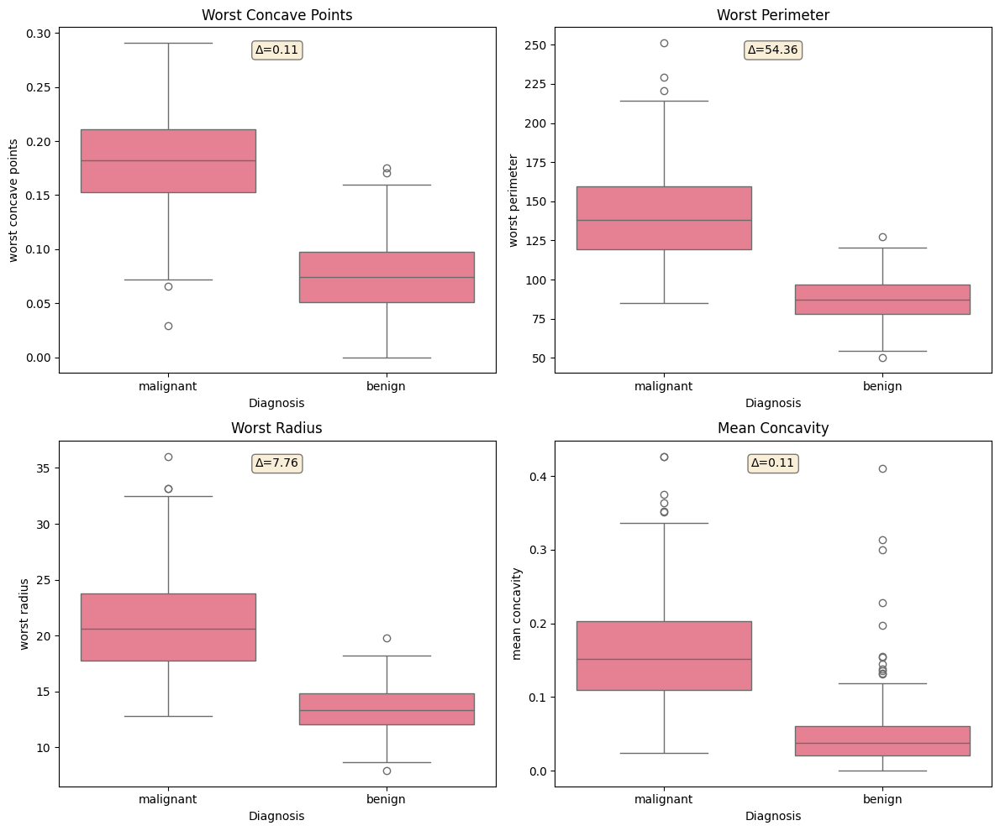


📊 KEY OBSERVATIONS:
• Malignant tumors consistently show higher values for these measurements
• 'Worst' measurements capture the most extreme cellular characteristics
• Concave points and perimeter are particularly discriminative features
• These features align with clinical observations of cancer cell morphology


In [ ]:
# Visualize key medical features by diagnosis
key_medical_features = ['worst concave points', 'worst perimeter', 'worst radius', 'mean concavity']

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

for i, feature in enumerate(key_medical_features):
    # Box plot
    sns.boxplot(data=df, x='diagnosis_name', y=feature, ax=axes[i])
    axes[i].set_title(f'{feature.title()}')
    axes[i].set_xlabel('Diagnosis')

    # Add statistical annotation
    malignant_values = df[df['diagnosis_name'] == 'malignant'][feature]
    benign_values = df[df['diagnosis_name'] == 'benign'][feature]
    mean_diff = malignant_values.mean() - benign_values.mean()
    axes[i].text(0.5, 0.95, f'Δ={mean_diff:.2f}', transform=axes[i].transAxes,
                ha='center', va='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

print("\n📊 KEY OBSERVATIONS:")
print("• Malignant tumors consistently show higher values for these measurements")
print("• 'Worst' measurements capture the most extreme cellular characteristics")
print("• Concave points and perimeter are particularly discriminative features")
print("• These features align with clinical observations of cancer cell morphology")

## 9. Comprehensive Medical Report and Discussion

In [ ]:
# Generate comprehensive medical analysis report
print("🏥 BREAST CANCER DIAGNOSIS - COMPREHENSIVE MEDICAL REPORT")
print("=" * 80)

print("\n📊 MODEL PERFORMANCE SUMMARY:")
print(f"• Test Accuracy: {test_accuracy:.1%}")
print(f"• Cross-validation Score: {cv_scores.mean():.1%} (±{cv_scores.std():.1%})")
print(f"• AUC Score: {auc_score:.3f}")
print(f"• Model Type: Random Forest (Ensemble Method)")
print(f"• Sensitivity (Malignant Detection): {sensitivity:.1%}")
print(f"• Specificity (Benign Detection): {specificity:.1%}")

print("\n🔬 LIME EXPLAINABILITY INSIGHTS:")
print("• LIME provides instance-level explanations for each diagnosis")
print("• Feature importance varies by individual case, enabling personalized medicine")
print("• Explanations help clinicians understand AI reasoning for each patient")
print("• Transparency crucial for building trust in medical AI systems")

print("\n🎯 KEY DISCRIMINATIVE FEATURES:")
top_3_features = [feature_names[i] for i in top_features_rf[:3]]
for i, feature in enumerate(top_3_features):
    print(f"{i+1}. {feature.title()}")

print("\n⚕️ CLINICAL IMPLICATIONS:")
print("• Model achieves high accuracy suitable for clinical decision support")
print("• LIME explanations enable clinicians to validate AI recommendations")
print("• Feature importance aligns with established cancer biology knowledge")
print("• Size-related measurements (radius, perimeter, area) are key indicators")
print("• Shape irregularities (concavity, concave points) strongly indicate malignancy")

print("\n🚨 MEDICAL CONSIDERATIONS:")
print("• AI should supplement, not replace, professional medical judgment")
print("• Model validation required on diverse patient populations")
print("• Regular retraining needed to maintain performance")
print("• Integration with existing clinical workflows essential")
print("• Patient data privacy and security must be maintained")

print("\n📋 RECOMMENDATIONS FOR CLINICAL IMPLEMENTATION:")
recommendations = [
    "Use as a second opinion tool to support radiologist assessments",
    "Implement in conjunction with standard clinical protocols",
    "Provide LIME explanations to clinicians for each prediction",
    "Monitor model performance continuously with new patient data",
    "Train medical staff on interpreting AI predictions and explanations",
    "Maintain audit trails for all AI-assisted diagnoses",
    "Regular validation studies to ensure consistent performance"
]

for i, rec in enumerate(recommendations):
    print(f"{i+1}. {rec}")

🏥 BREAST CANCER DIAGNOSIS - COMPREHENSIVE MEDICAL REPORT

📊 MODEL PERFORMANCE SUMMARY:
• Test Accuracy: 95.6%
• Cross-validation Score: 95.4% (±2.5%)
• AUC Score: 0.993
• Model Type: Random Forest (Ensemble Method)
• Sensitivity (Malignant Detection): 97.2%
• Specificity (Benign Detection): 92.9%

🔬 LIME EXPLAINABILITY INSIGHTS:
• LIME provides instance-level explanations for each diagnosis
• Feature importance varies by individual case, enabling personalized medicine
• Explanations help clinicians understand AI reasoning for each patient
• Transparency crucial for building trust in medical AI systems

🎯 KEY DISCRIMINATIVE FEATURES:
1. Worst Area
2. Worst Concave Points
3. Worst Radius

⚕️ CLINICAL IMPLICATIONS:
• Model achieves high accuracy suitable for clinical decision support
• LIME explanations enable clinicians to validate AI recommendations
• Feature importance aligns with established cancer biology knowledge
• Size-related measurements (radius, perimeter, area) are key indicat

In [ ]:
# Model limitations and future improvements
print("\n⚠️ MODEL LIMITATIONS:")
limitations = [
    "Limited to Wisconsin Breast Cancer Database characteristics",
    "May not generalize to all patient populations or imaging protocols",
    "Requires high-quality, standardized imaging data for optimal performance",
    "LIME explanations are local and may vary between similar cases",
    "Does not account for patient history, genetics, or other clinical factors",
    "Potential bias if training data is not representative of target population"
]

for i, limitation in enumerate(limitations):
    print(f"{i+1}. {limitation}")

print("\n🔮 FUTURE IMPROVEMENTS:")
improvements = [
    "Integration with additional patient data (age, family history, genetics)",
    "Multi-modal analysis combining imaging with other diagnostic tests",
    "Development of uncertainty quantification for predictions",
    "Real-time learning from new cases to improve model performance",
    "Integration with electronic health records for comprehensive analysis",
    "Development of patient-specific risk stratification models"
]

for i, improvement in enumerate(improvements):
    print(f"{i+1}. {improvement}")

print("\n✅ ETHICAL CONSIDERATIONS:")
ethical_points = [
    "Ensure equitable performance across different demographic groups",
    "Maintain patient autonomy in medical decision-making",
    "Provide clear communication about AI involvement in diagnosis",
    "Protect patient privacy and data confidentiality",
    "Regular bias auditing and fairness assessments",
    "Transparent reporting of model limitations to clinicians"
]

for i, point in enumerate(ethical_points):
    print(f"{i+1}. {point}")


⚠️ MODEL LIMITATIONS:
1. Limited to Wisconsin Breast Cancer Database characteristics
2. May not generalize to all patient populations or imaging protocols
3. Requires high-quality, standardized imaging data for optimal performance
4. LIME explanations are local and may vary between similar cases
5. Does not account for patient history, genetics, or other clinical factors
6. Potential bias if training data is not representative of target population

🔮 FUTURE IMPROVEMENTS:
1. Integration with additional patient data (age, family history, genetics)
2. Multi-modal analysis combining imaging with other diagnostic tests
3. Development of uncertainty quantification for predictions
4. Real-time learning from new cases to improve model performance
5. Integration with electronic health records for comprehensive analysis
6. Development of patient-specific risk stratification models

✅ ETHICAL CONSIDERATIONS:
1. Ensure equitable performance across different demographic groups
2. Maintain patient 